<a href="https://colab.research.google.com/github/Saicharitha2004/Smart-Sorting-Transfer-Learning-for-identifying-rotten-fruits-and-vegetables/blob/main/Smart_Sorting_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import os
import shutil
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
import shutil
from sklearn.model_selection import train_test_split
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.layers import Dense, Flatten
from tensorflow.keras.models import Model
from keras.optimizers import Adam
from tensorflow.keras.applications.resnet50 import ResNet50
from tensorflow.keras.layers import Dense, Flatten
from tensorflow.keras.models import Model
from keras.preprocessing import image
from keras.applications.vgg16 import preprocess_input
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import random
from IPython.display import Image, display

In [ ]:
from zipfile import ZipFile
import os

# Upload file first using upload button
uploaded_path = "/content/drive/MyDrive/archive.zip"

with ZipFile(uploaded_path, 'r') as zip_ref:
    zip_ref.extractall("/content/dataset")

In [ ]:
import numpy as np
from sklearn.model_selection import train_test_split
# Set the path to the dataset
dataset_dir ='/content/dataset/Fruit And Vegetable Diseases Dataset'
classes = os.listdir(dataset_dir)
# Create directories for train, val, and test sets
output_dir = 'output_dataset'
os.makedirs (output_dir, exist_ok=True)
os.makedirs (os.path.join(output_dir, 'train'), exist_ok=True)
os.makedirs(os.path.join(output_dir, 'val'), exist_ok=True)
os.makedirs (os.path.join(output_dir, 'test'), exist_ok=True)
for cls in classes:
  os.makedirs (os.path.join(output_dir, 'train', cls), exist_ok=True)
  os.makedirs(os.path.join(output_dir, 'val', cls), exist_ok=True)
  os.makedirs(os.path.join(output_dir, 'test', cls), exist_ok=True)
  class_dir = os.path.join(dataset_dir, cls)
  images = os.listdir(class_dir) [:200]
  print(cls,len(images))
  train_and_val_images, test_images= train_test_split(images, test_size=0.2, random_state=42)
  train_images, val_images = train_test_split(train_and_val_images, test_size=0.25, random_state=42) # 0.25 * 0.8 = 0.2
  # Copy images to respective directories
  for img in train_images:
    shutil.copy(os.path.join(class_dir, img), os.path.join(output_dir, 'train', cls, img))
  for img in val_images:
    shutil.copy(os.path.join(class_dir, img), os.path.join(output_dir, 'val', cls, img))
  for img in test_images:
    shutil.copy(os.path.join(class_dir, img), os.path.join(output_dir, 'test', cls, img))
print("Dataset split into training, validation, and test sets.")

Strawberry__Healthy 200
Cucumber__Rotten 200
Mango__Rotten 200
Grape__Rotten 200
Strawberry__Rotten 200
Tomato__Rotten 200
Jujube__Rotten 200
Apple__Healthy 200
Bellpepper__Rotten 200
Orange__Healthy 200
Potato__Healthy 200
Pomegranate__Healthy 200
Guava__Rotten 200
Mango__Healthy 200
Cucumber__Healthy 200
Orange__Rotten 200
Bellpepper__Healthy 200
Banana__Healthy 200
Grape__Healthy 200
Apple__Rotten 200
Potato__Rotten 200
Tomato__Healthy 200
Jujube__Healthy 200
Carrot__Healthy 200
Banana__Rotten 200
Carrot__Rotten 200
Guava__Healthy 200
Pomegranate__Rotten 200
Dataset split into training, validation, and test sets.


In [ ]:
#define directories
dataset_dir = '/content/output_dataset'
train_dir = os.path.join(dataset_dir, 'train')
val_dir= os.path.join(dataset_dir, 'val')
test_dir = os.path.join(dataset_dir, 'test')
# Define image size expected by the pre-trained model
IMG_SIZE = (224, 224) # Common size for many models like ResNet, VGG, MobileNet
#Create ImageDataGenerators for resizing and augmenting the images
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)
val_test_datagen = ImageDataGenerator (rescale=1./255)
# Load and resize the images from directories
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=IMG_SIZE,
    batch_size=32,
    class_mode='categorical'# Assuming binary classification for healthy vs rotten
)
val_generator = val_test_datagen.flow_from_directory(
    val_dir,
    target_size=IMG_SIZE,
    batch_size=32,
    class_mode='categorical'
)
test_generator = val_test_datagen.flow_from_directory(
    test_dir,
    target_size=IMG_SIZE,
    batch_size=32,
    class_mode='categorical'
)
#print class indices for reference
print(train_generator.class_indices)
print(val_generator.class_indices)
print(test_generator.class_indices)

Found 3360 images belonging to 28 classes.
Found 1119 images belonging to 28 classes.
Found 1119 images belonging to 28 classes.
{'Apple__Healthy': 0, 'Apple__Rotten': 1, 'Banana__Healthy': 2, 'Banana__Rotten': 3, 'Bellpepper__Healthy': 4, 'Bellpepper__Rotten': 5, 'Carrot__Healthy': 6, 'Carrot__Rotten': 7, 'Cucumber__Healthy': 8, 'Cucumber__Rotten': 9, 'Grape__Healthy': 10, 'Grape__Rotten': 11, 'Guava__Healthy': 12, 'Guava__Rotten': 13, 'Jujube__Healthy': 14, 'Jujube__Rotten': 15, 'Mango__Healthy': 16, 'Mango__Rotten': 17, 'Orange__Healthy': 18, 'Orange__Rotten': 19, 'Pomegranate__Healthy': 20, 'Pomegranate__Rotten': 21, 'Potato__Healthy': 22, 'Potato__Rotten': 23, 'Strawberry__Healthy': 24, 'Strawberry__Rotten': 25, 'Tomato__Healthy': 26, 'Tomato__Rotten': 27}
{'Apple__Healthy': 0, 'Apple__Rotten': 1, 'Banana__Healthy': 2, 'Banana__Rotten': 3, 'Bellpepper__Healthy': 4, 'Bellpepper__Rotten': 5, 'Carrot__Healthy': 6, 'Carrot__Rotten': 7, 'Cucumber__Healthy': 8, 'Cucumber__Rotten': 9, 'G

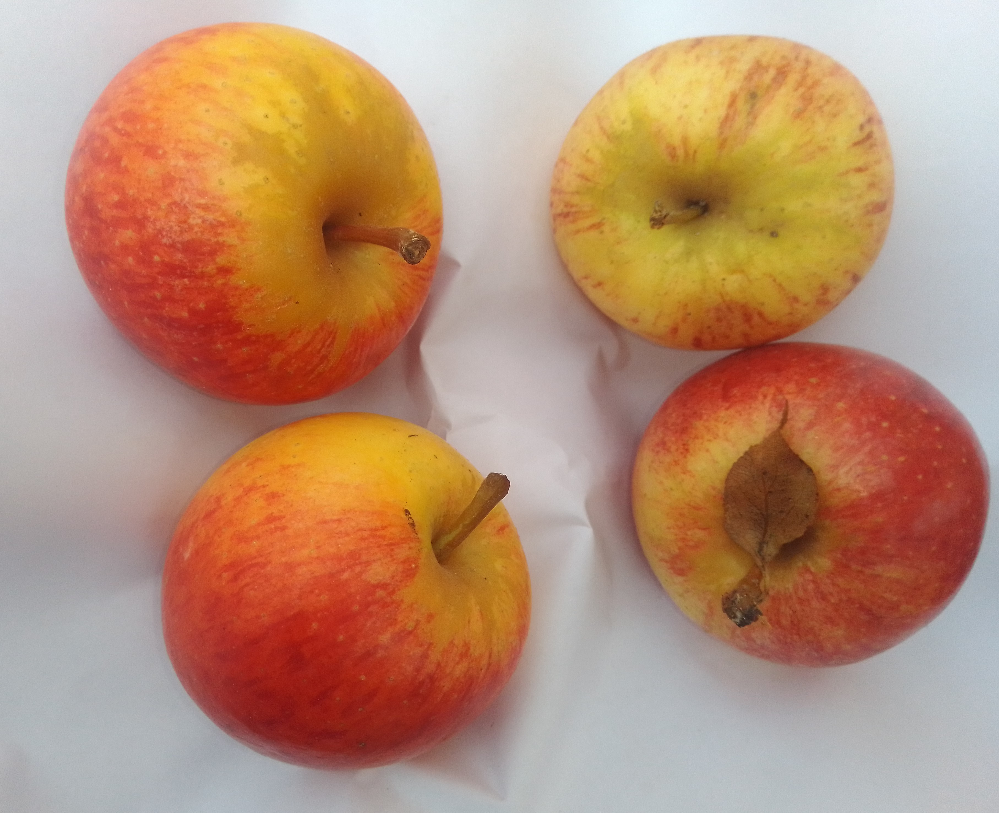

In [ ]:
#Specify the path to your image folder
folder_path='/content/output_dataset/train/Apple__Healthy'
#List all files in the folder
image_files=[f for f in os.listdir(folder_path) if f.endswith(('.jpg', '.png', '.jpeg'))]
#Select a canon leage fras the list
selected_image=random.choice(image_files)
#Display the randomly selected Image
image_path= os.path.join(folder_path, selected_image)
display(Image(filename=image_path))

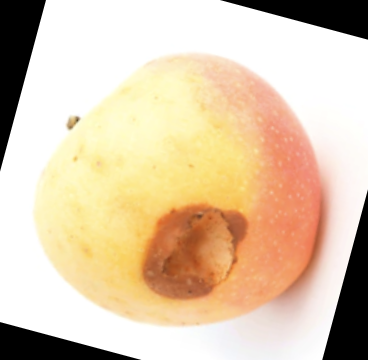

In [ ]:
#Specify the path to your image folder
folder_path='/content/output_dataset/train/Apple__Rotten'
#List all files in the folder
image_files=[f for f in os.listdir(folder_path) if f.endswith(('.jpg', '.png', '.jpeg'))]
#Select a canon leage fras the list
selected_image=random.choice(image_files)
#Display the randomly selected Image
image_path= os.path.join(folder_path, selected_image)
display(Image(filename=image_path))

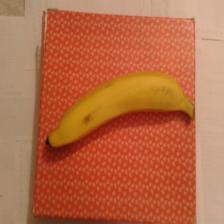

In [ ]:
#Specify the path to your image folder
folder_path='/content/output_dataset/train/Banana__Healthy'
#List all files in the folder
image_files=[f for f in os.listdir(folder_path) if f.endswith(('.jpg', '.png', '.jpeg'))]
#Select a canon leage fras the list
selected_image=random.choice(image_files)
#Display the randomly selected Image
image_path= os.path.join(folder_path, selected_image)
display(Image(filename=image_path))

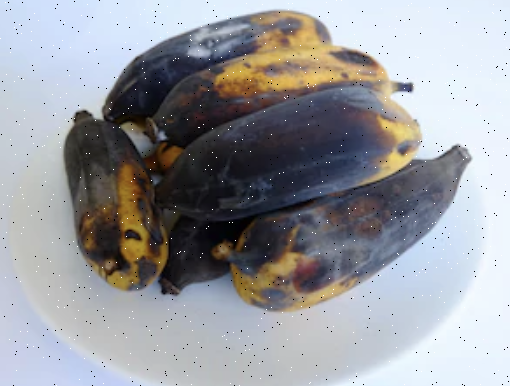

In [ ]:
#Specify the path to your image folder
folder_path='/content/output_dataset/train/Banana__Rotten'
#List all files in the folder
image_files=[f for f in os.listdir(folder_path) if f.endswith(('.jpg', '.png', '.jpeg'))]
#Select a canon leage fras the list
selected_image=random.choice(image_files)
#Display the randomly selected Image
image_path= os.path.join(folder_path, selected_image)
display(Image(filename=image_path))

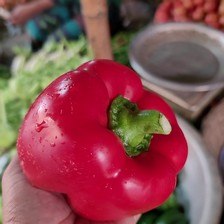

In [ ]:
#Specify the path to your image folder
folder_path='/content/output_dataset/train/Bellpepper__Healthy'
#List all files in the folder
image_files=[f for f in os.listdir(folder_path) if f.endswith(('.jpg', '.png', '.jpeg'))]
#Select a canon leage fras the list
selected_image=random.choice(image_files)
#Display the randomly selected Image
image_path= os.path.join(folder_path, selected_image)
display(Image(filename=image_path))

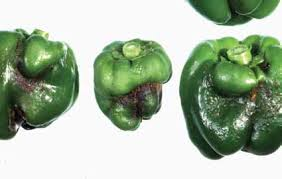

In [ ]:
#Specify the path to your image folder
folder_path='/content/output_dataset/train/Bellpepper__Rotten'
#List all files in the folder
image_files=[f for f in os.listdir(folder_path) if f.endswith(('.jpg', '.png', '.jpeg'))]
#Select a canon leage fras the list
selected_image=random.choice(image_files)
#Display the randomly selected Image
image_path= os.path.join(folder_path, selected_image)
display(Image(filename=image_path))

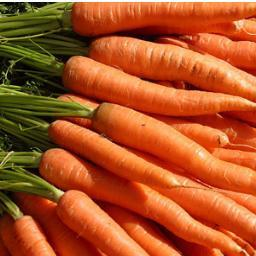

In [ ]:
#Specify the path to your image folder
folder_path='/content/output_dataset/train/Carrot__Healthy'
#List all files in the folder
image_files=[f for f in os.listdir(folder_path) if f.endswith((',jpg', '.png', '.jpeg'))]
#Select a canon leage fras the list
selected_image=random.choice(image_files)
#Display the randomly selected Image
image_path= os.path.join(folder_path, selected_image)
display(Image(filename=image_path))

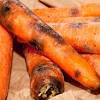

In [ ]:
#Specify the path to your image folder
folder_path='/content/output_dataset/train/Carrot__Rotten'
#List all files in the folder
image_files=[f for f in os.listdir(folder_path) if f.endswith(('.jpg', '.png', '.jpeg'))]
#Select a canon leage fras the list
selected_image=random.choice(image_files)
#Display the randomly selected Image
image_path= os.path.join(folder_path, selected_image)
display(Image(filename=image_path))

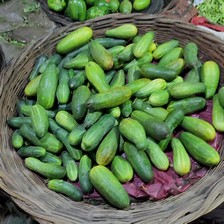

In [ ]:
#Specify the path to your image folder
folder_path='/content/output_dataset/train/Cucumber__Healthy'
#List all files in the folder
image_files=[f for f in os.listdir(folder_path) if f.endswith(('.jpg', '.png', '.jpeg'))]
#Select a canon leage fras the list
selected_image=random.choice(image_files)
#Display the randomly selected Image
image_path= os.path.join(folder_path, selected_image)
display(Image(filename=image_path))

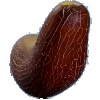

In [ ]:
#Specify the path to your image folder
folder_path='/content/output_dataset/train/Cucumber__Rotten'
#List all files in the folder
image_files=[f for f in os.listdir(folder_path) if f.endswith(('.jpg', '.png', '.jpeg'))]
#Select a canon leage fras the list
selected_image=random.choice(image_files)
#Display the randomly selected Image
image_path= os.path.join(folder_path, selected_image)
display(Image(filename=image_path))

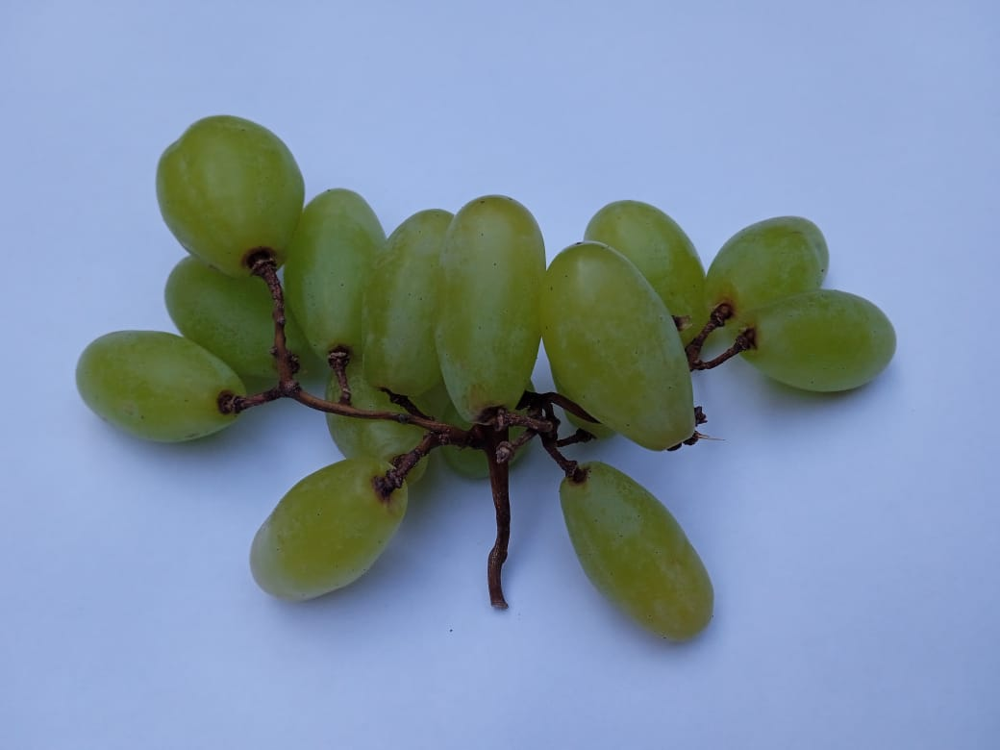

In [ ]:
#Specify the path to your image folder
folder_path='/content/output_dataset/train/Grape__Healthy'
#List all files in the folder
image_files=[f for f in os.listdir(folder_path) if f.endswith(('.jpg', '.png', '.jpeg'))]
#Select a canon leage fras the list
selected_image=random.choice(image_files)
#Display the randomly selected Image
image_path= os.path.join(folder_path, selected_image)
display(Image(filename=image_path))

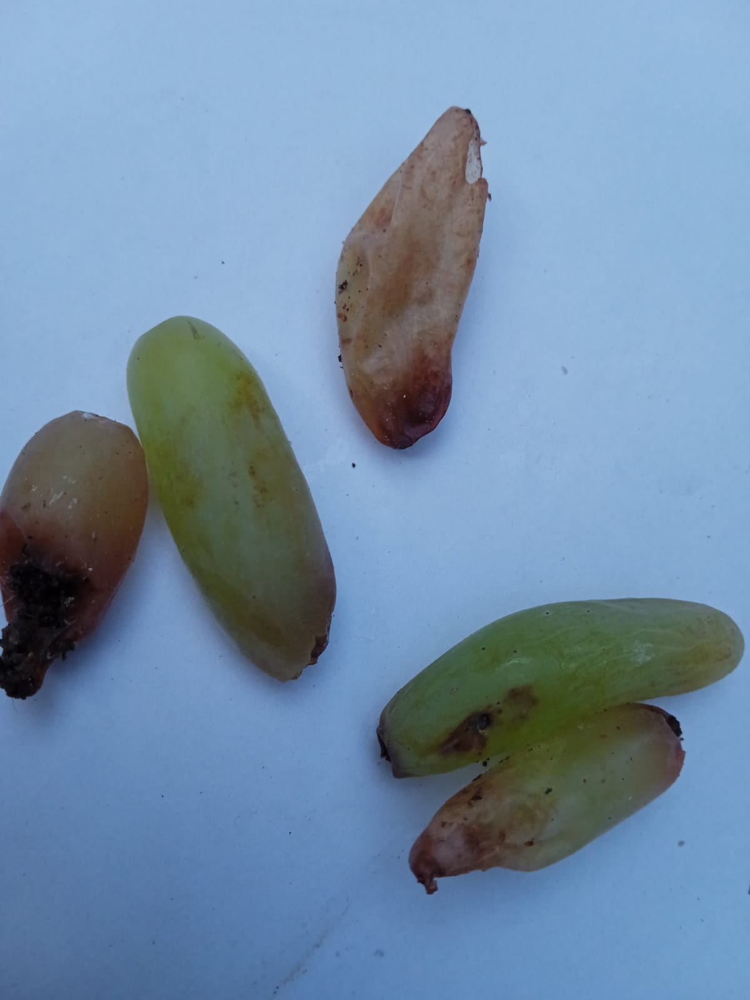

In [ ]:
#Specify the path to your image folder
folder_path='/content/output_dataset/train/Grape__Rotten'
#List all files in the folder
image_files=[f for f in os.listdir(folder_path) if f.endswith(('.jpg', '.png', '.jpeg'))]
#Select a canon leage fras the list
selected_image=random.choice(image_files)
#Display the randomly selected Image
image_path= os.path.join(folder_path, selected_image)
display(Image(filename=image_path))

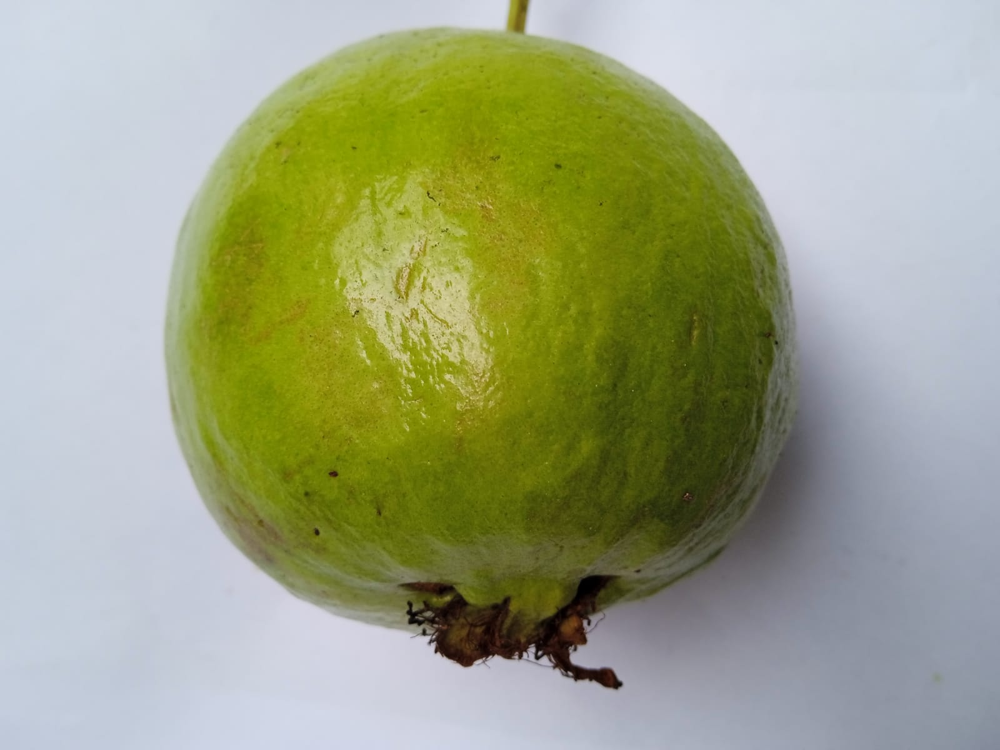

In [ ]:
#Specify the path to your image folder
folder_path='/content/output_dataset/train/Guava__Healthy'
#List all files in the folder
image_files=[f for f in os.listdir(folder_path) if f.endswith(('.jpg', '.png', '.jpeg'))]
#Select a canon leage fras the list
selected_image=random.choice(image_files)
#Display the randomly selected Image
image_path= os.path.join(folder_path, selected_image)
display(Image(filename=image_path))

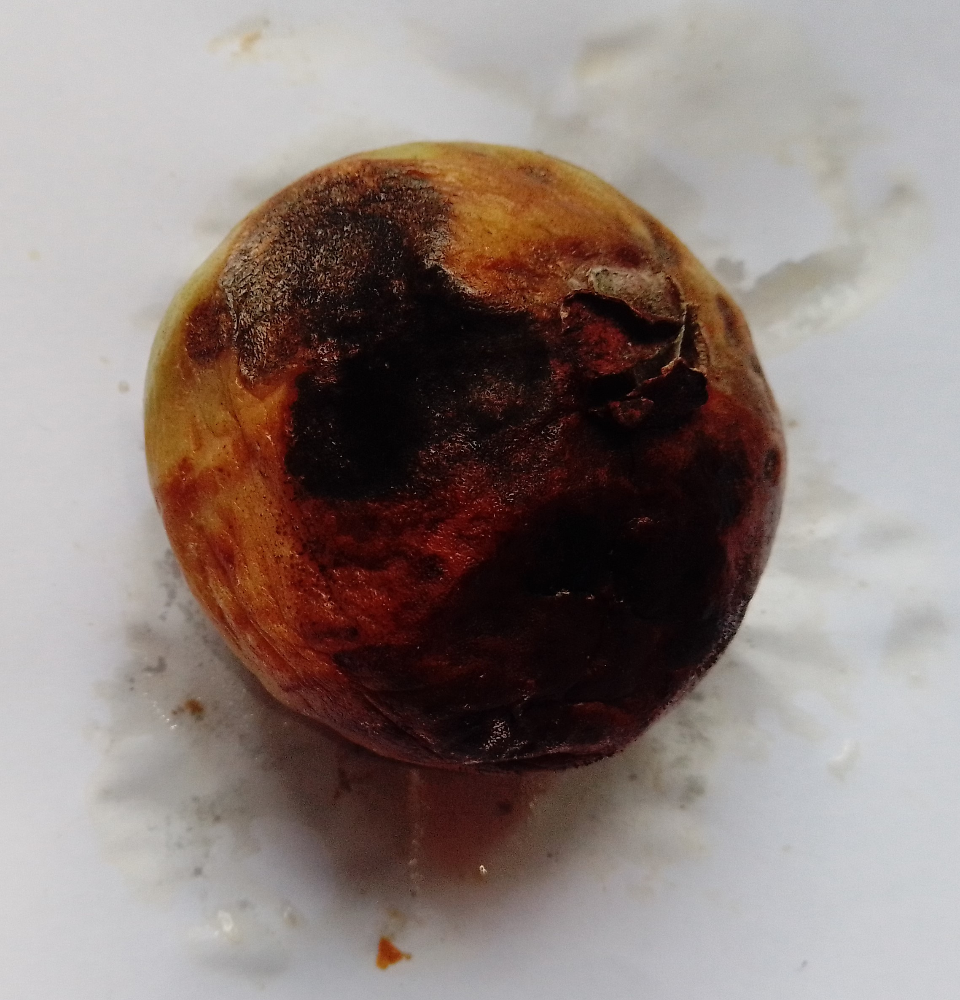

In [ ]:
#Specify the path to your image folder
folder_path='/content/output_dataset/train/Guava__Rotten'
#List all files in the folder
image_files=[f for f in os.listdir(folder_path) if f.endswith(('.jpg', '.png', '.jpeg'))]
#Select a canon leage fras the list
selected_image=random.choice(image_files)
#Display the randomly selected Image
image_path= os.path.join(folder_path, selected_image)
display(Image(filename=image_path))

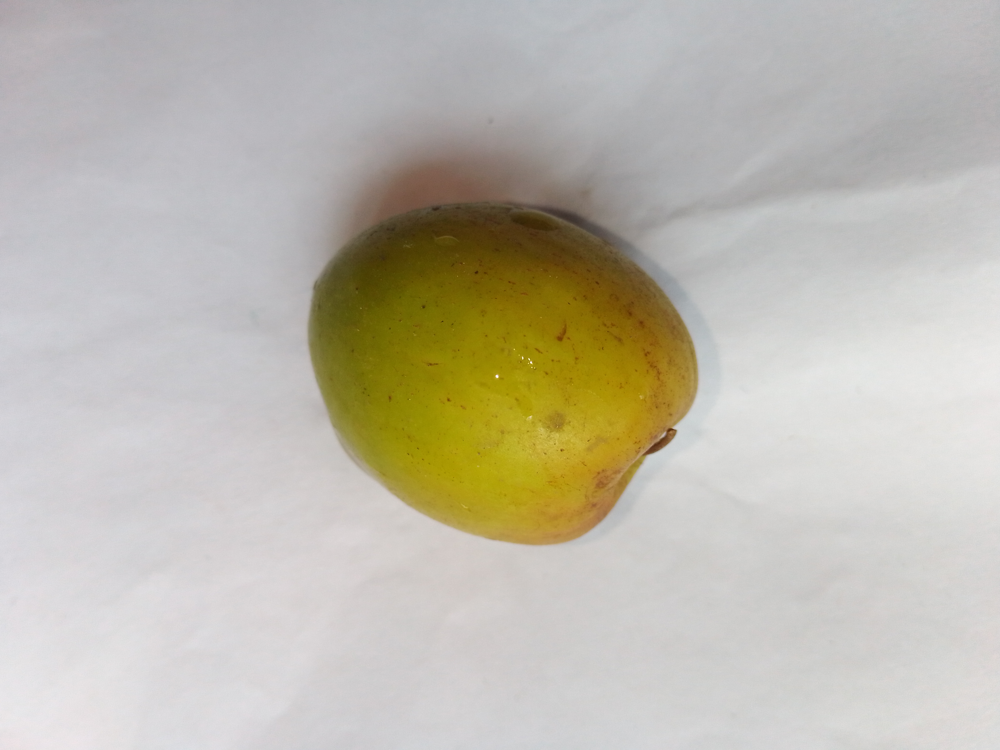

In [ ]:
#Specify the path to your image folder
folder_path='/content/output_dataset/train/Jujube__Healthy'
#List all files in the folder
image_files=[f for f in os.listdir(folder_path) if f.endswith(('.jpg', '.png', '.jpeg'))]
#Select a canon leage fras the list
selected_image=random.choice(image_files)
#Display the randomly selected Image
image_path= os.path.join(folder_path, selected_image)
display(Image(filename=image_path))

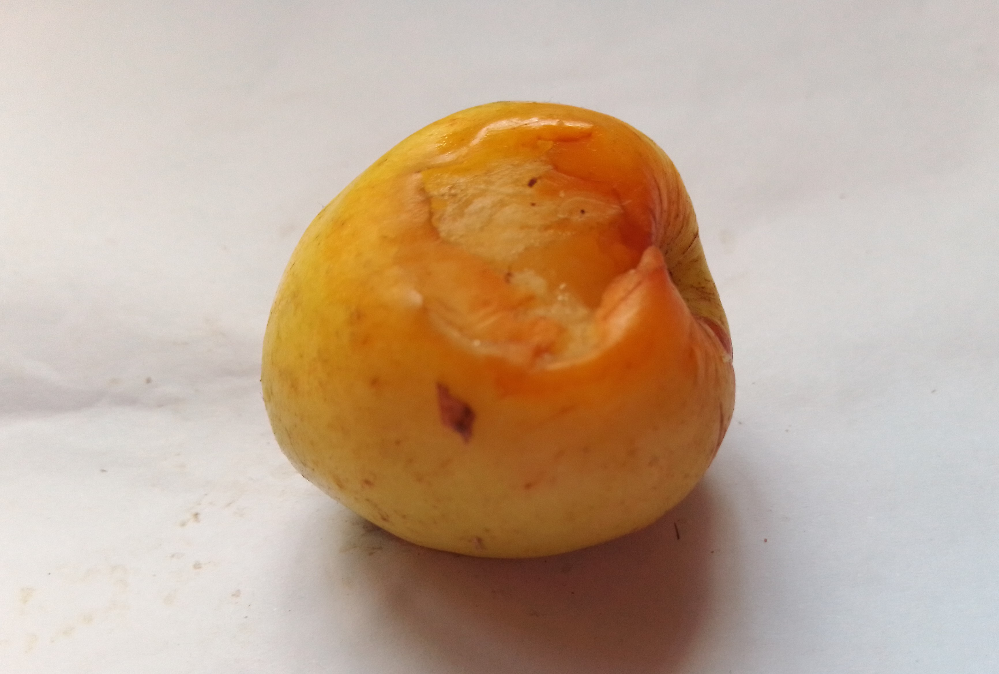

In [ ]:
#Specify the path to your image folder
folder_path='/content/output_dataset/train/Jujube__Rotten'
#List all files in the folder
image_files=[f for f in os.listdir(folder_path) if f.endswith(('.jpg', '.png', '.jpeg'))]
#Select a canon leage fras the list
selected_image=random.choice(image_files)
#Display the randomly selected Image
image_path= os.path.join(folder_path, selected_image)
display(Image(filename=image_path))

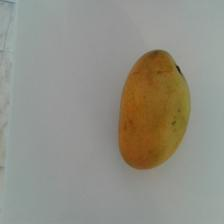

In [ ]:
#Specify the path to your image folder
folder_path='/content/output_dataset/train/Mango__Healthy'
#List all files in the folder
image_files=[f for f in os.listdir(folder_path) if f.endswith(('.jpg', '.png', '.jpeg'))]
#Select a canon leage fras the list
selected_image=random.choice(image_files)
#Display the randomly selected Image
image_path= os.path.join(folder_path, selected_image)
display(Image(filename=image_path))

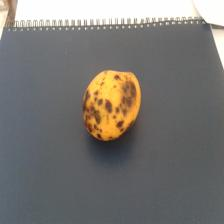

In [ ]:
#Specify the path to your image folder
folder_path='/content/output_dataset/train/Mango__Rotten'
#List all files in the folder
image_files=[f for f in os.listdir(folder_path) if f.endswith(('.jpg', '.png', '.jpeg'))]
#Select a canon leage fras the list
selected_image=random.choice(image_files)
#Display the randomly selected Image
image_path= os.path.join(folder_path, selected_image)
display(Image(filename=image_path))

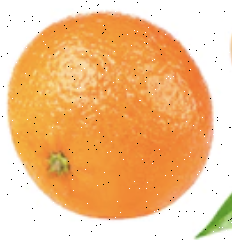

In [ ]:
#Specify the path to your image folder
folder_path='/content/output_dataset/train/Orange__Healthy'
#List all files in the folder
image_files=[f for f in os.listdir(folder_path) if f.endswith(('.jpg', '.png', '.jpeg'))]
#Select a canon leage fras the list
selected_image=random.choice(image_files)
#Display the randomly selected Image
image_path= os.path.join(folder_path, selected_image)
display(Image(filename=image_path))

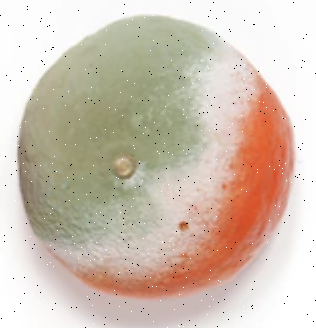

In [ ]:
#Specify the path to your image folder
folder_path='/content/output_dataset/train/Orange__Rotten'
#List all files in the folder
image_files=[f for f in os.listdir(folder_path) if f.endswith(('.jpg', '.png', '.jpeg'))]
#Select a canon leage fras the list
selected_image=random.choice(image_files)
#Display the randomly selected Image
image_path= os.path.join(folder_path, selected_image)
display(Image(filename=image_path))

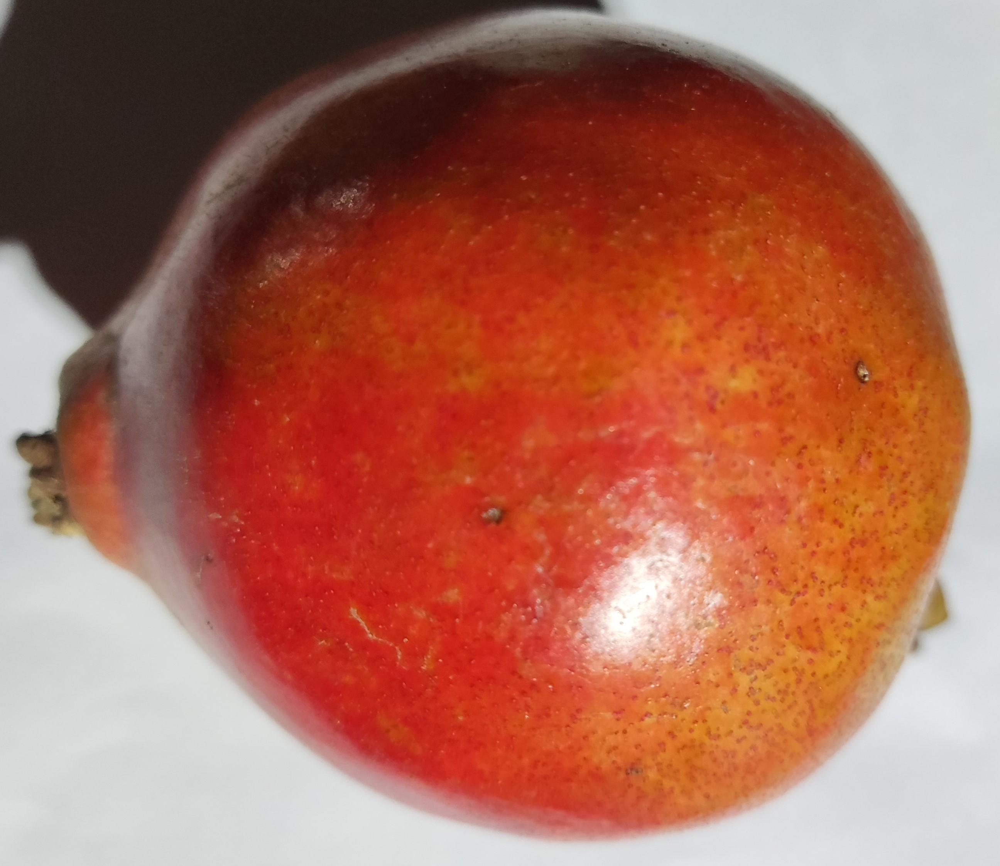

In [ ]:
#Specify the path to your image folder
folder_path='/content/output_dataset/train/Pomegranate__Healthy'
#List all files in the folder
image_files=[f for f in os.listdir(folder_path) if f.endswith(('.jpg', '.png', '.jpeg'))]
#Select a canon leage fras the list
selected_image=random.choice(image_files)
#Display the randomly selected Image
image_path= os.path.join(folder_path, selected_image)
display(Image(filename=image_path))

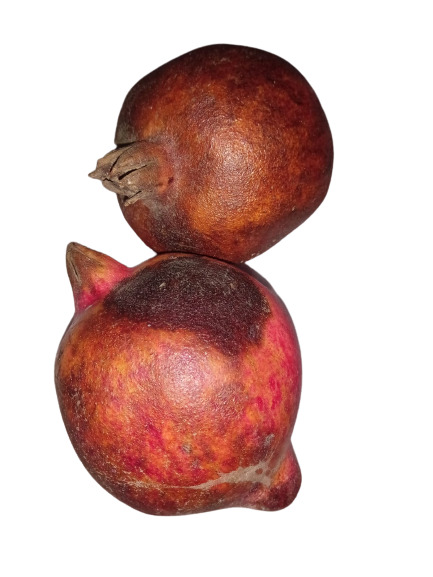

In [ ]:
#Specify the path to your image folder
folder_path='/content/output_dataset/train/Pomegranate__Rotten'
#List all files in the folder
image_files=[f for f in os.listdir(folder_path) if f.endswith(('.jpg', '.png', '.jpeg'))]
#Select a canon leage fras the list
selected_image=random.choice(image_files)
#Display the randomly selected Image
image_path= os.path.join(folder_path, selected_image)
display(Image(filename=image_path))

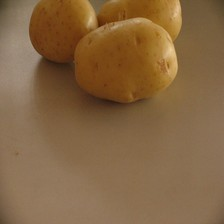

In [ ]:
#Specify the path to your image folder
folder_path='/content/output_dataset/train/Potato__Healthy'
#List all files in the folder
image_files=[f for f in os.listdir(folder_path) if f.endswith(('.jpg', '.png', '.jpeg'))]
#Select a canon leage fras the list
selected_image=random.choice(image_files)
#Display the randomly selected Image
image_path= os.path.join(folder_path, selected_image)
display(Image(filename=image_path))

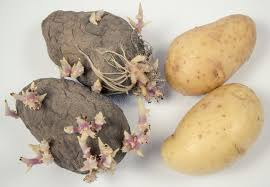

In [ ]:
#Specify the path to your image folder
folder_path='/content/output_dataset/train/Potato__Rotten'
#List all files in the folder
image_files=[f for f in os.listdir(folder_path) if f.endswith(('.jpg', '.png', '.jpeg'))]
#Select a canon leage fras the list
selected_image=random.choice(image_files)
#Display the randomly selected Image
image_path= os.path.join(folder_path, selected_image)
display(Image(filename=image_path))

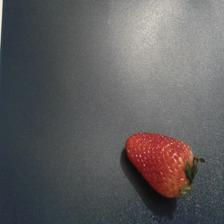

In [ ]:
#Specify the path to your image folder
folder_path='/content/output_dataset/train/Strawberry__Healthy'
#List all files in the folder
image_files=[f for f in os.listdir(folder_path) if f.endswith(('.jpg', '.png', '.jpeg'))]
#Select a canon leage fras the list
selected_image=random.choice(image_files)
#Display the randomly selected Image
image_path= os.path.join(folder_path, selected_image)
display(Image(filename=image_path))

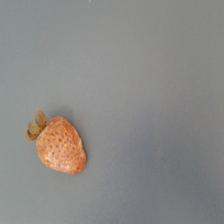

In [ ]:
#Specify the path to your image folder
folder_path='/content/output_dataset/train/Strawberry__Rotten'
#List all files in the folder
image_files=[f for f in os.listdir(folder_path) if f.endswith(('.jpg', '.png', '.jpeg'))]
#Select a canon leage fras the list
selected_image=random.choice(image_files)
#Display the randomly selected Image
image_path= os.path.join(folder_path, selected_image)
display(Image(filename=image_path))

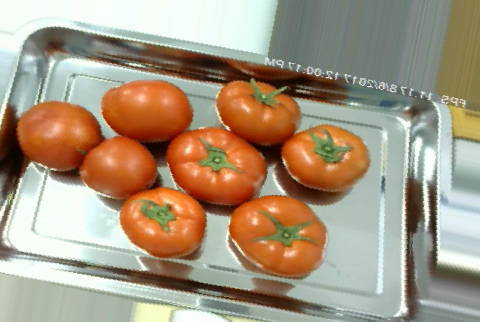

In [ ]:
#Specify the path to your image folder
folder_path='/content/output_dataset/train/Tomato__Healthy'
#List all files in the folder
image_files=[f for f in os.listdir(folder_path) if f.endswith(('.jpg', '.png', '.jpeg'))]
#Select a canon leage fras the list
selected_image=random.choice(image_files)
#Display the randomly selected Image
image_path= os.path.join(folder_path, selected_image)
display(Image(filename=image_path))

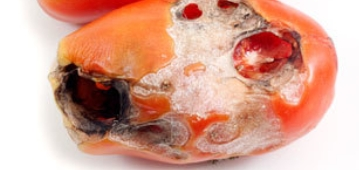

In [ ]:
#Specify the path to your image folder
folder_path='/content/output_dataset/train/Tomato__Rotten'
#List all files in the folder
image_files=[f for f in os.listdir(folder_path) if f.endswith(('.jpg', '.png', '.jpeg'))]
#Select a canon leage fras the list
selected_image=random.choice(image_files)
#Display the randomly selected Image
image_path= os.path.join(folder_path, selected_image)
display(Image(filename=image_path))

In [ ]:
trainpath="/content/output_dataset/train"
testpath="/content/output_dataset/test"
train_datagen= ImageDataGenerator(rescale = 1./255,zoom_range= 0.2, shear_range= 0.2)
test_datagen =ImageDataGenerator(rescale = 1./255)
train=train_datagen.flow_from_directory (trainpath, target_size =(224,224), batch_size = 20)
test=test_datagen.flow_from_directory(testpath, target_size=(224,224), batch_size = 20),#5,15, 32, 50

Found 3360 images belonging to 28 classes.
Found 1119 images belonging to 28 classes.


In [ ]:
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.layers import Dense, Flatten
from tensorflow.keras.models import Model

In [ ]:
vgg= VGG16(include_top = False, input_shape = (224,224,3))

58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [ ]:
for layer in vgg.layers:
  print(layer)

<InputLayer name=input_layer, built=True>
<Conv2D name=block1_conv1, built=True>
<Conv2D name=block1_conv2, built=True>
<MaxPooling2D name=block1_pool, built=True>
<Conv2D name=block2_conv1, built=True>
<Conv2D name=block2_conv2, built=True>
<MaxPooling2D name=block2_pool, built=True>
<Conv2D name=block3_conv1, built=True>
<Conv2D name=block3_conv2, built=True>
<Conv2D name=block3_conv3, built=True>
<MaxPooling2D name=block3_pool, built=True>
<Conv2D name=block4_conv1, built=True>
<Conv2D name=block4_conv2, built=True>
<Conv2D name=block4_conv3, built=True>
<MaxPooling2D name=block4_pool, built=True>
<Conv2D name=block5_conv1, built=True>
<Conv2D name=block5_conv2, built=True>
<Conv2D name=block5_conv3, built=True>
<MaxPooling2D name=block5_pool, built=True>


In [ ]:
len(vgg.layers)

19

In [ ]:
for layer in vgg.layers:
  layer.trainable = False

In [ ]:
x= Flatten()(vgg.output)

In [ ]:
output = Dense (28, activation = 'softmax')(x)

In [ ]:
vgg16 = Model (vgg.input,output)

In [ ]:
vgg16.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 28)             │       702,492 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 15,417,180 (58.81 MB)

 Trainable params: 702,492 (2.68 MB)

 Non-trainable params: 14,714,688 (56.13 MB)

In [ ]:
from keras.callbacks import EarlyStopping
from keras.optimizers import Adam

In [ ]:
opt = Adam(learning_rate=0.0001)
# Assuming you have defined your VGG16 model as vgg16
# Define Early Stopping callback
early_stopping = EarlyStopping(monitor='val_accuracy', patience=5, restore_best_weights=True)
# Compile the model (you may have already done this)
vgg16.compile(optimizer = "Adam" ,loss='categorical_crossentropy', metrics=['accuracy'])
## Train the model with early stopping callback
history = vgg16.fit(train, validation_data=test,
epochs=15,
callbacks=[early_stopping])

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/15
168/168 ━━━━━━━━━━━━━━━━━━━━ 2510s 15s/step - accuracy: 0.3812 - loss: 2.5974 - val_accuracy: 0.7283 - val_loss: 0.8955
Epoch 2/15
168/168 ━━━━━━━━━━━━━━━━━━━━ 2501s 15s/step - accuracy: 0.8427 - loss: 0.4990 - val_accuracy: 0.7122 - val_loss: 1.0774
Epoch 3/15
168/168 ━━━━━━━━━━━━━━━━━━━━ 2516s 15s/step - accuracy: 0.8898 - loss: 0.3369 - val_accuracy: 0.7185 - val_loss: 1.0546
Epoch 4/15
168/168 ━━━━━━━━━━━━━━━━━━━━ 2478s 15s/step - accuracy: 0.9467 - loss: 0.1790 - val_accuracy: 0.8016 - val_loss: 0.7341
Epoch 5/15
168/168 ━━━━━━━━━━━━━━━━━━━━ 2467s 15s/step - accuracy: 0.9477 - loss: 0.1668 - val_accuracy: 0.7811 - val_loss: 0.9019
Epoch 6/15
168/168 ━━━━━━━━━━━━━━━━━━━━ 2476s 15s/step - accuracy: 0.9622 - loss: 0.1211 - val_accuracy: 0.7828 - val_loss: 0.8546
Epoch 7/15
168/168 ━━━━━━━━━━━━━━━━━━━━ 2458s 15s/step - accuracy: 0.9691 - loss: 0.0990 - val_accuracy: 0.8070 - val_loss: 0.7247
Epoch 8/15
168/168 ━━━━━━━━━━━━━━━━━━━━ 2455s 15s/step - accuracy: 0.9803 - loss: 0

In [ ]:
history = vgg16.fit(train, validation_data=test, epochs=15)

In [ ]:
labels=[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27]

In [ ]:
img_path='/content/output_dataset/train/Apple__Healthy/FreshApple (122).jpg'

In [ ]:
import numpy as np
img = load_img(img_path, target_size=(224, 224))
x = img_to_array(img)
x = preprocess_input(x)
preds = vgg16.predict(np.array([x]))
preds

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


array([[1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]], dtype=float32)

In [ ]:
labels [np.argmax(preds)]

0

In [ ]:
img_path='/content/output_dataset/train/Apple__Rotten/Screen Shot 2018-06-07 at 2.24.02 PM.png'

In [ ]:
import numpy as np
img = load_img(img_path, target_size=(224, 224))
x = img_to_array(img)
x = preprocess_input(x)
preds = vgg16.predict(np.array([x]))
preds

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 476ms/step


array([[2.2386798e-28, 1.0000000e+00, 0.0000000e+00, 0.0000000e+00,
        0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
        0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
        0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
        0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
        0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
        0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00]],
      dtype=float32)

In [ ]:
labels [np.argmax(preds)]

1

In [ ]:
img_path='/content/output_dataset/train/Banana__Healthy/Banana__Healthy_augmented_145.jpg'

In [ ]:
import numpy as np
img = load_img(img_path, target_size=(224, 224))
x = img_to_array(img)
x = preprocess_input(x)
preds = vgg16.predict(np.array([x]))
preds

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 474ms/step


array([[0.0000000e+00, 0.0000000e+00, 7.5104123e-07, 2.1187237e-15,
        0.0000000e+00, 2.1153518e-04, 6.6429285e-36, 0.0000000e+00,
        0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
        0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
        0.0000000e+00, 0.0000000e+00, 9.9978775e-01, 0.0000000e+00,
        0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
        0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00]],
      dtype=float32)

In [ ]:
labels [np.argmax(preds)]

18

In [ ]:
img_path='/content/output_dataset/train/Banana__Rotten/Screen Shot 2018-06-12 at 8.47.14 PM.png'

In [ ]:
import numpy as np
img = load_img(img_path, target_size=(224, 224))
x = img_to_array(img)
x = preprocess_input(x)
preds = vgg16.predict(np.array([x]))
preds

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 876ms/step


array([[0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]], dtype=float32)

In [ ]:
labels [np.argmax(preds)]

3

In [ ]:
img_path='/content/output_dataset/train/Bellpepper__Healthy/freshPepper (1).jpeg'

In [ ]:
import numpy as np
img = load_img(img_path, target_size=(224, 224))
x = img_to_array(img)
x = preprocess_input(x)
preds = vgg16.predict(np.array([x]))
preds

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 490ms/step


array([[0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]], dtype=float32)

In [ ]:
labels [np.argmax(preds)]

4

In [ ]:
img_path='/content/output_dataset/train/Bellpepper__Rotten/rottenPepper (110).jpg'

In [ ]:
import numpy as np
img = load_img(img_path, target_size=(224, 224))
x = img_to_array(img)
x = preprocess_input(x)
preds = vgg16.predict(np.array([x]))
preds

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 479ms/step


array([[0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]], dtype=float32)

In [ ]:
labels [np.argmax(preds)]

5

In [ ]:
img_path='/content/output_dataset/train/Carrot__Healthy/freshCarrot (109).jpg'

In [ ]:
import numpy as np
img = load_img(img_path, target_size=(224, 224))
x = img_to_array(img)
x = preprocess_input(x)
preds = vgg16.predict(np.array([x]))
preds

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 839ms/step


array([[0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 1.0000000e+00,
        0.0000000e+00, 3.3072873e-16, 0.0000000e+00, 0.0000000e+00,
        0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
        0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
        0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
        0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
        0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00]],
      dtype=float32)

In [ ]:
labels [np.argmax(preds)]

3

In [ ]:
img_path='/content/output_dataset/train/Carrot__Rotten/rottenCarrot (1).jpeg'

In [ ]:
import numpy as np
img = load_img(img_path, target_size=(224, 224))
x = img_to_array(img)
x = preprocess_input(x)
preds = vgg16.predict(np.array([x]))
preds

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 504ms/step


array([[0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 1.8892158e-07,
        0.0000000e+00, 3.6050369e-32, 9.9999976e-01, 2.7577020e-35,
        0.0000000e+00, 4.3278809e-34, 0.0000000e+00, 0.0000000e+00,
        0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
        0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
        0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
        0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00]],
      dtype=float32)

In [ ]:
labels [np.argmax(preds)]

6

In [ ]:
img_path='/content/output_dataset/train/Cucumber__Healthy/freshCucumber (103).jpg'

In [ ]:
import numpy as np
img = load_img(img_path, target_size=(224, 224))
x = img_to_array(img)
x = preprocess_input(x)
preds = vgg16.predict(np.array([x]))
preds

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 662ms/step


array([[0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]], dtype=float32)

In [ ]:
labels [np.argmax(preds)]

8

In [ ]:
img_path='/content/output_dataset/train/Cucumber__Rotten/rottenCucumber (105).jpg'

In [ ]:
import numpy as np
img = load_img(img_path, target_size=(224, 224))
x = img_to_array(img)
x = preprocess_input(x)
preds = vgg16.predict(np.array([x]))
preds

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 498ms/step


array([[0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]], dtype=float32)

In [ ]:
labels [np.argmax(preds)]

9

In [ ]:
img_path='/content/output_dataset/train/Grape__Healthy/FreshGrape (1).jpg'

In [ ]:
import numpy as np
img = load_img(img_path, target_size=(224, 224))
x = img_to_array(img)
x = preprocess_input(x)
preds = vgg16.predict(np.array([x]))
preds

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 565ms/step


array([[0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
        1.0298356e-31, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
        9.2810011e-01, 0.0000000e+00, 7.1899869e-02, 0.0000000e+00,
        0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
        0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
        0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
        0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00]],
      dtype=float32)

In [ ]:
labels [np.argmax(preds)]

8

In [ ]:
img_path='/content/output_dataset/train/Grape__Rotten/RottenGrape (104).jpg'

In [ ]:
import numpy as np
img = load_img(img_path, target_size=(224, 224))
x = img_to_array(img)
x = preprocess_input(x)
preds = vgg16.predict(np.array([x]))
preds

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 496ms/step


array([[0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
        4.5802222e-15, 1.0000000e+00, 0.0000000e+00, 0.0000000e+00,
        0.0000000e+00, 1.3060594e-28, 0.0000000e+00, 0.0000000e+00,
        0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
        0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
        0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
        0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00]],
      dtype=float32)

In [ ]:
labels [np.argmax(preds)]

5

In [ ]:
img_path='/content/output_dataset/train/Guava__Healthy/FreshGuava (101).jpg'

In [ ]:
import numpy as np
img = load_img(img_path, target_size=(224, 224))
x = img_to_array(img)
x = preprocess_input(x)
preds = vgg16.predict(np.array([x]))
preds

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 493ms/step


array([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]], dtype=float32)

In [ ]:
labels [np.argmax(preds)]

12

In [ ]:
img_path='/content/output_dataset/train/Guava__Rotten/RottenGuava (107).jpg'

In [ ]:
import numpy as np
img = load_img(img_path, target_size=(224, 224))
x = img_to_array(img)
x = preprocess_input(x)
preds = vgg16.predict(np.array([x]))
preds

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 531ms/step


array([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]], dtype=float32)

In [ ]:
labels [np.argmax(preds)]

13

In [ ]:
img_path='/content/output_dataset/train/Jujube__Healthy/FreshJujube (104).jpg'

In [ ]:
import numpy as np
img = load_img(img_path, target_size=(224, 224))
x = img_to_array(img)
x = preprocess_input(x)
preds = vgg16.predict(np.array([x]))
preds

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 501ms/step


array([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]], dtype=float32)

In [ ]:
labels [np.argmax(preds)]

14

In [ ]:
img_path='/content/output_dataset/train/Jujube__Rotten/RottenJujube (100).jpg'

In [ ]:
import numpy as np
img = load_img(img_path, target_size=(224, 224))
x = img_to_array(img)
x = preprocess_input(x)
preds = vgg16.predict(np.array([x]))
preds

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 522ms/step


array([[0.0000000e+00, 4.1806116e-16, 0.0000000e+00, 8.9641288e-35,
        0.0000000e+00, 3.0070806e-33, 0.0000000e+00, 0.0000000e+00,
        0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
        4.3778697e-23, 1.0000000e+00, 0.0000000e+00, 0.0000000e+00,
        0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
        0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
        0.0000000e+00, 0.0000000e+00, 6.1720652e-31, 0.0000000e+00]],
      dtype=float32)

In [ ]:
labels [np.argmax(preds)]

13

In [ ]:
img_path='/content/output_dataset/train/Mango__Healthy/121.jpg'

In [ ]:
import numpy as np
img = load_img(img_path, target_size=(224, 224))
x = img_to_array(img)
x = preprocess_input(x)
preds = vgg16.predict(np.array([x]))
preds

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 477ms/step


array([[0.000000e+00, 0.000000e+00, 0.000000e+00, 0.000000e+00,
        0.000000e+00, 0.000000e+00, 0.000000e+00, 0.000000e+00,
        0.000000e+00, 0.000000e+00, 0.000000e+00, 0.000000e+00,
        1.781788e-38, 0.000000e+00, 1.000000e+00, 0.000000e+00,
        0.000000e+00, 0.000000e+00, 0.000000e+00, 0.000000e+00,
        0.000000e+00, 0.000000e+00, 0.000000e+00, 0.000000e+00,
        0.000000e+00, 0.000000e+00, 0.000000e+00, 0.000000e+00]],
      dtype=float32)

In [ ]:
labels [np.argmax(preds)]

14

In [ ]:
img_path='/content/output_dataset/train/Mango__Rotten/143.jpg'

In [ ]:
import numpy as np
img = load_img(img_path, target_size=(224, 224))
x = img_to_array(img)
x = preprocess_input(x)
preds = vgg16.predict(np.array([x]))
preds

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 479ms/step


array([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]], dtype=float32)

In [ ]:
labels [np.argmax(preds)]

17

In [ ]:
img_path='/content/output_dataset/train/Orange__Healthy/Screen Shot 2018-06-12 at 11.58.43 PM.png'

In [ ]:
import numpy as np
img = load_img(img_path, target_size=(224, 224))
x = img_to_array(img)
x = preprocess_input(x)
preds = vgg16.predict(np.array([x]))
preds

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 568ms/step


array([[0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
        0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
        0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
        1.0000000e+00, 1.8801144e-37, 0.0000000e+00, 0.0000000e+00,
        0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
        0.0000000e+00, 9.3447046e-30, 0.0000000e+00, 0.0000000e+00,
        0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00]],
      dtype=float32)

In [ ]:
labels [np.argmax(preds)]

12

In [ ]:
img_path='/content/output_dataset/train/Orange__Rotten/Screen Shot 2018-06-12 at 11.32.41 PM.png'

In [ ]:
import numpy as np
img = load_img(img_path, target_size=(224, 224))
x = img_to_array(img)
x = preprocess_input(x)
preds = vgg16.predict(np.array([x]))
preds

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 515ms/step


array([[0.0000000e+00, 1.0000000e+00, 0.0000000e+00, 0.0000000e+00,
        0.0000000e+00, 1.3998128e-29, 0.0000000e+00, 0.0000000e+00,
        0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
        4.1971354e-23, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
        0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
        0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
        0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00]],
      dtype=float32)

In [ ]:
labels [np.argmax(preds)]

1

In [ ]:
img_path='/content/output_dataset/train/Pomegranate__Healthy/FreshPomegranate (101).jpg'

In [ ]:
import numpy as np
img = load_img(img_path, target_size=(224, 224))
x = img_to_array(img)
x = preprocess_input(x)
preds = vgg16.predict(np.array([x]))
preds

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 858ms/step


array([[0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
        0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
        0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
        0.0000000e+00, 1.7844673e-24, 0.0000000e+00, 0.0000000e+00,
        0.0000000e+00, 1.0000000e+00, 0.0000000e+00, 0.0000000e+00,
        1.6039802e-23, 9.7234419e-38, 0.0000000e+00, 0.0000000e+00,
        0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00]],
      dtype=float32)

In [ ]:
labels [np.argmax(preds)]

17

In [ ]:
img_path='/content/output_dataset/train/Pomegranate__Rotten/RottenPomegranate (104).jpg'

In [ ]:
import numpy as np
img = load_img(img_path, target_size=(224, 224))
x = img_to_array(img)
x = preprocess_input(x)
preds = vgg16.predict(np.array([x]))
preds

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 475ms/step


array([[0.000000e+00, 0.000000e+00, 0.000000e+00, 0.000000e+00,
        0.000000e+00, 1.000000e+00, 0.000000e+00, 0.000000e+00,
        0.000000e+00, 0.000000e+00, 0.000000e+00, 0.000000e+00,
        0.000000e+00, 0.000000e+00, 0.000000e+00, 0.000000e+00,
        0.000000e+00, 0.000000e+00, 0.000000e+00, 0.000000e+00,
        0.000000e+00, 4.364168e-21, 0.000000e+00, 0.000000e+00,
        0.000000e+00, 0.000000e+00, 0.000000e+00, 0.000000e+00]],
      dtype=float32)

In [ ]:
labels [np.argmax(preds)]

5

In [ ]:
img_path='/content/output_dataset/train/Potato__Healthy/freshPotato (107).jpg'

In [ ]:
import numpy as np
img = load_img(img_path, target_size=(224, 224))
x = img_to_array(img)
x = preprocess_input(x)
preds = vgg16.predict(np.array([x]))
preds

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 501ms/step


array([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0.]], dtype=float32)

In [ ]:
labels [np.argmax(preds)]

22

In [ ]:
img_path='/content/output_dataset/train/Potato__Rotten/rottenPotato (1).png'

In [ ]:
import numpy as np
img = load_img(img_path, target_size=(224, 224))
x = img_to_array(img)
x = preprocess_input(x)
preds = vgg16.predict(np.array([x]))
preds

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 473ms/step


array([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0.]], dtype=float32)

In [ ]:
labels [np.argmax(preds)]

23

In [ ]:
img_path='/content/output_dataset/train/Strawberry__Healthy/101.jpg'

In [ ]:
import numpy as np
img = load_img(img_path, target_size=(224, 224))
x = img_to_array(img)
x = preprocess_input(x)
preds = vgg16.predict(np.array([x]))
preds

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 480ms/step


array([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.]], dtype=float32)

In [ ]:
labels [np.argmax(preds)]

24

In [ ]:
img_path='/content/output_dataset/train/Strawberry__Rotten/101.jpg'

In [ ]:
import numpy as np
img = load_img(img_path, target_size=(224, 224))
x = img_to_array(img)
x = preprocess_input(x)
preds = vgg16.predict(np.array([x]))
preds

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 492ms/step


array([[0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 4.4476596e-23,
        0.0000000e+00, 1.0000000e+00, 0.0000000e+00, 0.0000000e+00,
        0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
        0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
        0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
        0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
        1.9424931e-35, 1.3084006e-32, 0.0000000e+00, 0.0000000e+00]],
      dtype=float32)

In [ ]:
labels [np.argmax(preds)]

5

In [ ]:
img_path='/content/output_dataset/train/Tomato__Healthy/freshTomato (1).jpeg'

In [ ]:
import numpy as np
img = load_img(img_path, target_size=(224, 224))
x = img_to_array(img)
x = preprocess_input(x)
preds = vgg16.predict(np.array([x]))
preds

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 474ms/step


array([[0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]], dtype=float32)

In [ ]:
labels [np.argmax(preds)]

5

In [ ]:
img_path='/content/output_dataset/train/Tomato__Rotten/rottenTomato (1).webp'

In [ ]:
import numpy as np
img = load_img(img_path, target_size=(224, 224))
x = img_to_array(img)
x = preprocess_input(x)
preds = vgg16.predict(np.array([x]))
preds

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 843ms/step


array([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0.]], dtype=float32)

In [ ]:
labels [np.argmax(preds)]

26

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, precision_score, recall_score, f1_score
import numpy as np

# Get the true labels and predicted probabilities from the test generator
y_true = []
y_pred_probs = []

# Iterate over the test generator to get predictions
# The test_generator provides batches of images and their true labels
for i in range(len(test_generator)):
    images, labels_batch = test_generator[i]
    predictions_batch = vgg16.predict(images)

    # Append true labels and predicted probabilities to lists
    y_true.extend(labels_batch) # Convert one-hot encoded labels to class indices
    y_pred_probs.extend(predictions_batch)

# Convert lists to numpy arrays
y_true = np.array(y_true)
y_pred_probs = np.array(y_pred_probs)

# Convert true labels from one-hot encoded to class indices
y_true_classes = np.argmax(y_true, axis=1)

# Convert predicted probabilities to class labels
y_pred = np.argmax(y_pred_probs, axis=1)

# Accuracy
# Use the converted y_true_classes for metric calculations
accuracy = accuracy_score(y_true_classes, y_pred)
print("Accuracy:", accuracy)

# Precision, Recall, F1
precision = precision_score(y_true_classes, y_pred, average='weighted')
recall = recall_score(y_true_classes, y_pred, average='weighted')
f1 = f1_score(y_true_classes, y_pred, average='weighted')

print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)

# Confusion Matrix
conf_matrix = confusion_matrix(y_true_classes, y_pred)
print("Confusion Matrix:\n", conf_matrix)

# Classification Report
print("Classification Report:\n", classification_report(y_true_classes, y_pred))

1/1 ━━━━━━━━━━━━━━━━━━━━ 20s 20s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 17s 17s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 18s 18s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 17s 17s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 17s 17s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 17s 17s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 18s 18s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 20s 20s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 19s 19s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 17s 17s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 17s 17s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 20s 20s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 23s 23s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 22s 22s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 20s 20s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 22s 22s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 23s 23s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 18s 18s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 19s 19s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 26s 26s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 22s 22s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 24s 24s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 25s 25s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 25s 25s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 28s 28s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 25s 25s/step
1/1 ━━━━━━━━

In [ ]:
history = vgg16.fit(train, validation_data=test, epochs=15, callbacks=[early_stopping])


In [ ]:
import matplotlib.pyplot as plt

# For initial training
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy - Initial Training')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend()
plt.show()

# For fine-tuning
plt.plot(history_fine.history['accuracy'], label='Training Accuracy')
plt.plot(history_fine.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy - Fine Tuning')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend()
plt.show()

In [ ]:
vgg16.save('/content/smart_sorting_model.h5')

In [ ]:
vgg16.save('my_model.keras')

In [ ]:
from google.colab import files
files.download('/content/my_model.keras')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
from google.colab import files
files.download('/content/smart_sorting_model.h5')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# model/predict.py
import numpy as np
from tensorflow.keras.models import load_model
from PIL import Image

model = load_model()

def predict_image(image_path):
    img = Image.open(image_path).resize((224, 224))
    img = np.array(img) / 255.0
    img = np.expand_dims(img, axis=0)
    prediction = model.predict(img)
    return "Rotten" if prediction[0][0] > 0.5 else "Fresh"

In [ ]:
# Unfreeze some top layers of VGG16 (e.g., from block5_conv1 onwards)
fine_tune_at = 15  # Layer index to start fine-tuning from

for layer in vgg16.layers[:fine_tune_at]:
    layer.trainable = False

for layer in vgg16.layers[fine_tune_at:]:
    layer.trainable = True

# Compile the model again (with low learning rate)
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

fine_tune_lr = 1e-5  # smaller LR for fine-tuning
vgg16.compile(optimizer=Adam(learning_rate=fine_tune_lr),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Early stopping to prevent overfitting
checkpoint = ModelCheckpoint('/content/my_model.keras', monitor='val_accuracy', save_best_only=True)
early_stopping = EarlyStopping(monitor='val_accuracy', patience=3, restore_best_weights=True)

# Re-train the model
history_fine = vgg16.fit(
    train_generator,
    validation_data=val_generator,
    epochs=10,
    callbacks=[early_stopping]
)

Epoch 1/10
105/105 ━━━━━━━━━━━━━━━━━━━━ 0s 22s/step - accuracy: 0.1708 - loss: 2.9973 

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


105/105 ━━━━━━━━━━━━━━━━━━━━ 2905s 28s/step - accuracy: 0.1713 - loss: 2.9954 - val_accuracy: 0.3804 - val_loss: 2.2072
Epoch 2/10
105/105 ━━━━━━━━━━━━━━━━━━━━ 2891s 28s/step - accuracy: 0.3888 - loss: 2.1563 - val_accuracy: 0.5464 - val_loss: 1.5381
Epoch 3/10
105/105 ━━━━━━━━━━━━━━━━━━━━ 2922s 28s/step - accuracy: 0.5421 - loss: 1.5790 - val_accuracy: 0.6464 - val_loss: 1.1915
Epoch 4/10
105/105 ━━━━━━━━━━━━━━━━━━━━ 2917s 27s/step - accuracy: 0.6269 - loss: 1.2712 - val_accuracy: 0.6866 - val_loss: 1.0266
Epoch 5/10
105/105 ━━━━━━━━━━━━━━━━━━━━ 2846s 27s/step - accuracy: 0.6776 - loss: 1.0801 - val_accuracy: 0.7321 - val_loss: 0.8940
Epoch 6/10
105/105 ━━━━━━━━━━━━━━━━━━━━ 2862s 27s/step - accuracy: 0.7094 - loss: 0.9488 - val_accuracy: 0.7661 - val_loss: 0.7959
Epoch 7/10
105/105 ━━━━━━━━━━━━━━━━━━━━ 2848s 27s/step - accuracy: 0.7396 - loss: 0.8488 - val_accuracy: 0.7857 - val_loss: 0.7229
Epoch 8/10
105/105 ━━━━━━━━━━━━━━━━━━━━ 2865s 27s/step - accuracy: 0.7775 - loss: 0.7732 - val

In [ ]:
import pickle

In [ ]:
with open('sorting.pkl','wb') as file:
  pickle.dump(vgg16,file)

In [ ]:
# Get the final training and validation accuracy from the fine-tuning history
final_train_accuracy = history_fine.history['accuracy'][-1]
final_val_accuracy = history_fine.history['val_accuracy'][-1]

print(f"Final Training Accuracy (Fine-tuning): {final_train_accuracy}")
print(f"Final Validation Accuracy (Fine-tuning): {final_val_accuracy}")